# Motivation

When digitalising documents it is very often case when scanned document pages have some distortions and noise that worsen quality of page and overall document. In this coursework I will simulate this case.

# Introduction

To solve problem described above, we will use convolutional neural network for image denoising. An autoencoder is a type of neural network that learns to compress and reconstruct input data. It consists of an encoder that compresses the data into a lower-dimensional representation, and a decoder that reconstructs the original data from the compressed representation [U-Net](https://en.wikipedia.org/wiki/U-Net) is used as baseline architecture.

# Description

Firstly we will prepare synthetic data. Then noise will be applied to images. After that we will build convolutional autoencoder and train it using our synthetic data prepared earlier.

### Prepare data

In [1]:
# Convert pdf document into images
from pdf2image import convert_from_path
import os
import shutil
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
from augraphy import *

pages = convert_from_path("59248-pdf.pdf", dpi=80)

if os.path.isdir('images'):
    shutil.rmtree('images/', ignore_errors=True)

os.makedirs("images/")

for i, image in enumerate(pages):
      cv2.imwrite("images/page_"+str(i)+".png", np.asarray(image))

file_paths = glob.glob("images/*.png")

# prepare synthetic noise function
# def noise(image):
#     dirtydrum1 = [DirtyDrum(line_width_range=(1, 4),
#                         line_concentration=0.1,
#                         direction=0,
#                         noise_intensity=0.5,
#                         noise_value=(0, 30),
#                         ksize=(3, 3),
#                         sigmaX=0,
#                         )]
    
#     badphotocopy = [BadPhotoCopy(noise_type=1,
#                                    noise_side="left",
#                                    noise_iteration=(2,3),
#                                    noise_size=(2,3),
#                                    noise_sparsity=(0.15,0.15),
#                                    noise_concentration=(0.3,0.3),
#                                    blur_noise=-1,
#                                    blur_noise_kernel=(5, 5),
#                                    wave_pattern=0,
#                                    edge_effect=0)]
    
#     post = [BindingsAndFasteners(overlay_types="darken",
#                                           foreground=None,
#                                           effect_type="punch_holes",
#                                           width_range = (70,80),
#                                           height_range = (70,80),
#                                           ntimes=(3, 3),
#                                           nscales=(1.5, 1.5),
#                                           edge="left",
#                                           edge_offset=(30,50),
#                                           use_figshare_library=0,
#                                           )]

#     pipeline = AugraphyPipeline(dirtydrum1, post, badphotocopy)
#     complete = pipeline.augment(image)
#     print(image.shape)
#     print(complete['output'].shape)
#     return complete['output']

def noise(array):
    noise_factor = 0.2
    noisy_array = array + noise_factor * np.random.normal(
        loc=0.0, scale=1.0, size=array.shape
    )

    return np.clip(noisy_array, 0.0, 1.0)

original_images = []

for i, file_path in enumerate(file_paths):
    image = cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    original_images.append(image)

original_images = np.asarray(original_images)
print(original_images.shape)


(448, 552, 416)


313
135
(135, 552, 416)
(313, 552, 416)


<Figure size 2000x400 with 0 Axes>

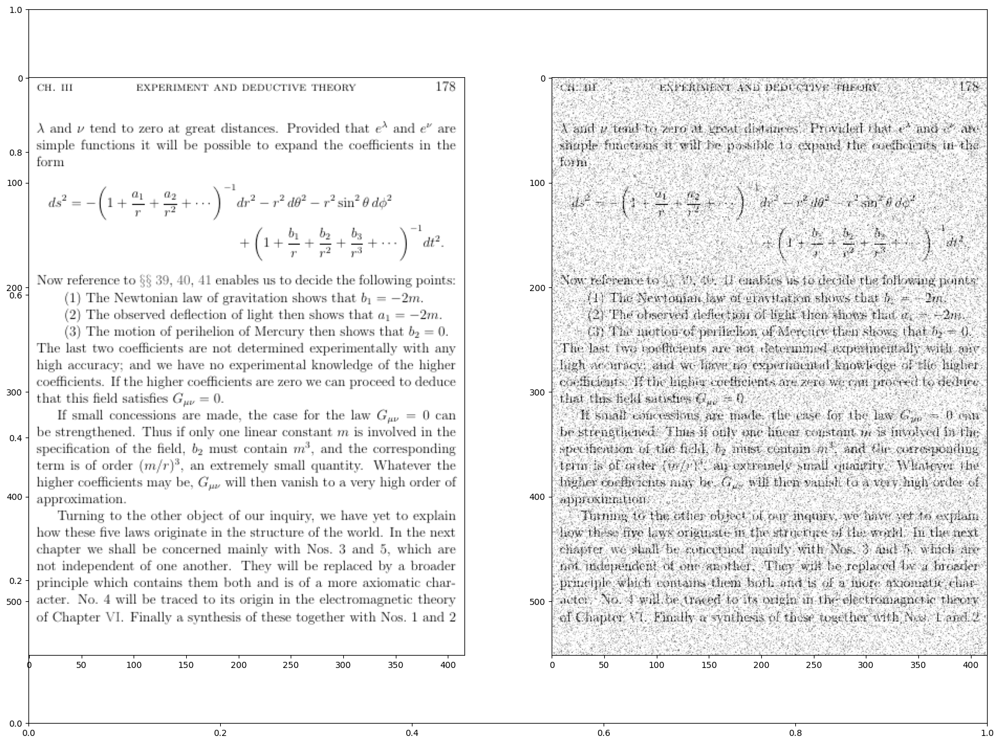

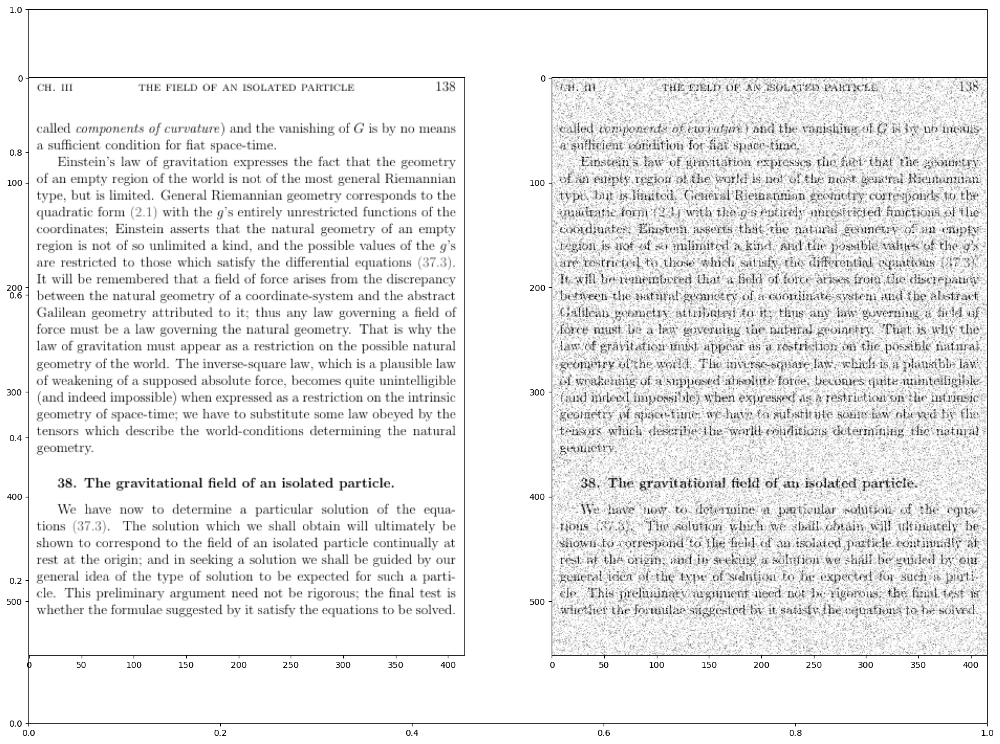

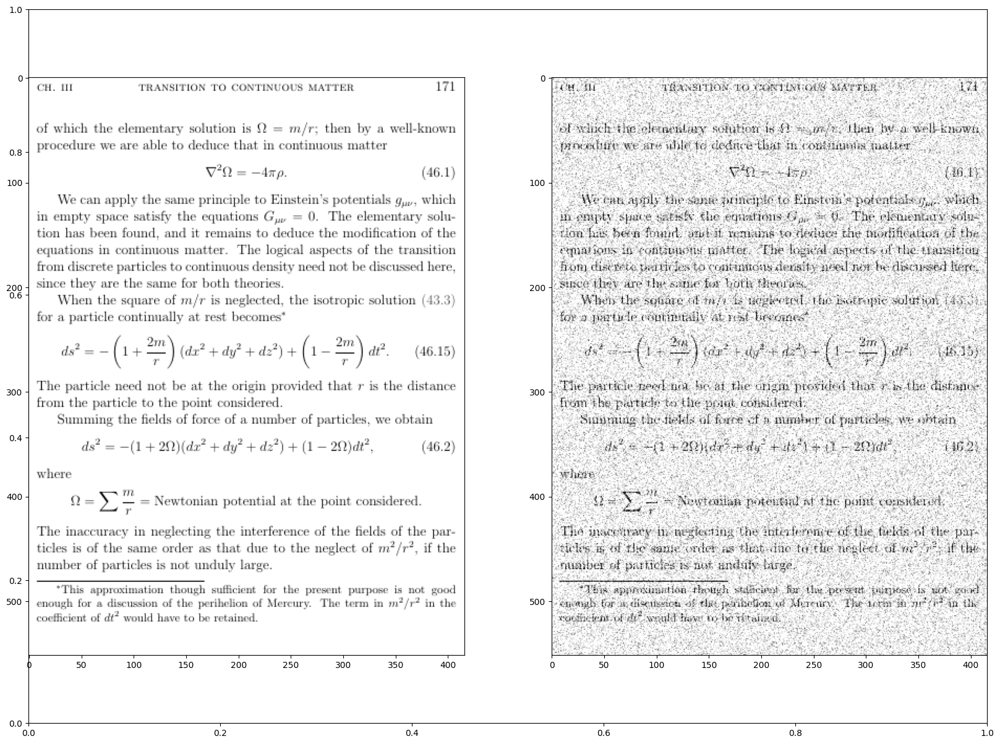

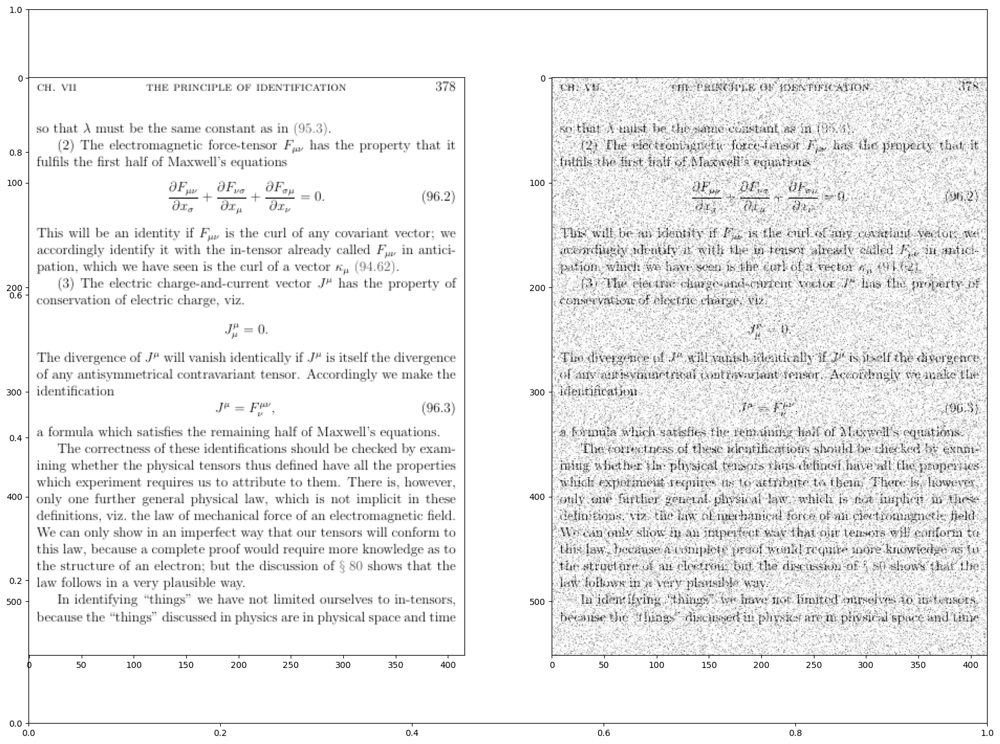

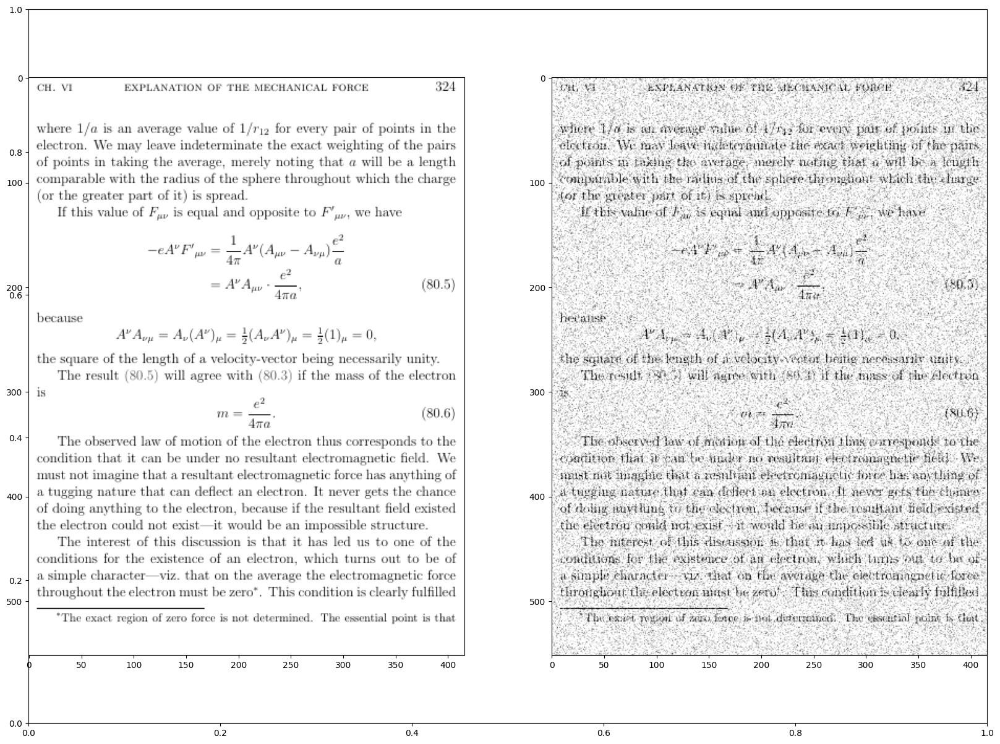

In [2]:
from sklearn.model_selection import train_test_split

def display(array1, array2):
    """Displays ten random images from each array."""
    n = 5
    indices = np.random.randint(len(array1), size=n)
    images1 = array1[indices, :]
    images2 = array2[indices, :]

    plt.figure(figsize=(20, 4))
    for i, (image1, image2) in enumerate(zip(images1, images2)):
        fig, axes = plt.subplots(figsize=(20,15))
        plt.subplot(121)
        plt.imshow(image1, cmap='gray')
        plt.subplot(122)
        plt.imshow(image2, cmap='gray')

    plt.show()

# split dataset into train and validation, 70% (train) / 30% (test)
train, test = train_test_split(original_images, train_size=0.7,random_state=1)

print(len(train))
print(len(test))

train = train / 255.0
test = test / 255.0

noisy_train_data = noise(train)
noisy_test_data = noise(test)


print(noisy_test_data.shape)
print(noisy_train_data.shape)

display(train, noisy_train_data)


### Build the autoencoder

In [3]:
from keras import layers
from keras.models import Model
from keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Dropout, UpSampling2D

input = layers.Input(shape=(552, 416, 1))

# Encoder
x = Conv2D(64, (3, 3), activation='relu', padding='same')(input)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Dropout(0.5)(x)

#decoder
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = BatchNormalization()(x)
x = UpSampling2D((2, 2))(x)
output_layer = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

# Autoencoder
autoencoder = Model(input, output_layer)
autoencoder.compile(optimizer="adam", loss="mean_squared_error")
autoencoder.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 552, 416, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 552, 416, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 552, 416, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 552, 416, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 276, 208, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 276, 208, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 276, 208, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 276, 208, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 276, 208, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 552, 416, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 552, 416, 1)    │           577 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 297,217 (1.13 MB)

 Trainable params: 296,833 (1.13 MB)

 Non-trainable params: 384 (1.50 KB)

### Training

In [4]:

autoencoder.fit(
    x=noisy_train_data,
    y=train,
    epochs=30,
    batch_size=5,
    shuffle=True,
    validation_data=(noisy_test_data, test),
)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 230s 4s/step - loss: 0.1087 - val_loss: 0.0330
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 231s 4s/step - loss: 0.0183 - val_loss: 0.0245
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 225s 4s/step - loss: 0.0074 - val_loss: 0.0236
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 217s 3s/step - loss: 0.0063 - val_loss: 0.0223
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 216s 3s/step - loss: 0.0062 - val_loss: 0.0199
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 216s 3s/step - loss: 0.0056 - val_loss: 0.0164
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 216s 3s/step - loss: 0.0051 - val_loss: 0.0154
Epoch 8/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 216s 3s/step - loss: 0.0050 - val_loss: 0.0107
Epoch 9/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 212s 3s/step - loss: 0.0049 - val_loss: 0.0072
Epoch 10/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 212s 3s/step - loss: 0.0048 - val_loss: 0.0053
Epoch 11/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 219s 3s/step - loss: 0.0047 - val_loss: 0.0046
Epoch 12/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 226s 4s/step - loss: 0.0

5/5 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step
76.43534234682359


<Figure size 2000x400 with 0 Axes>

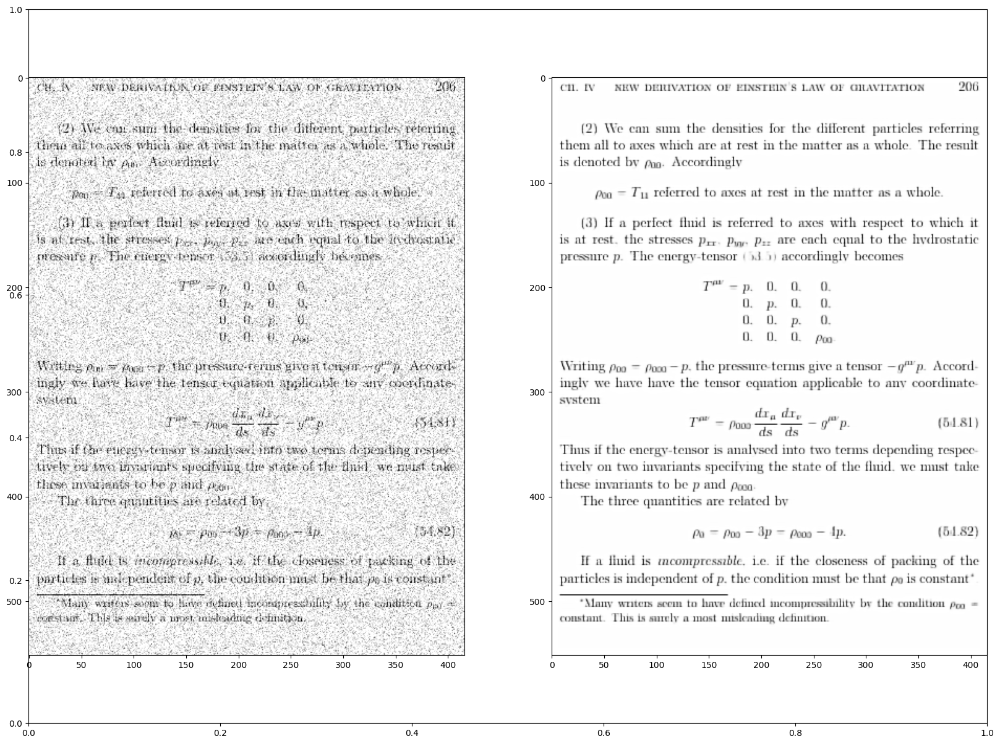

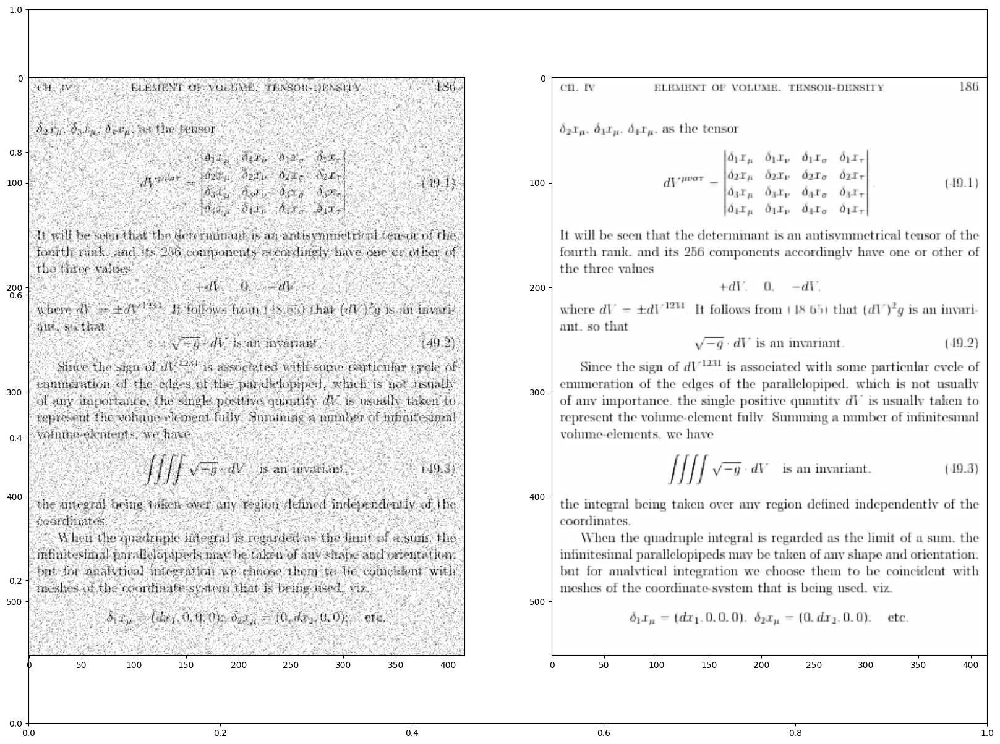

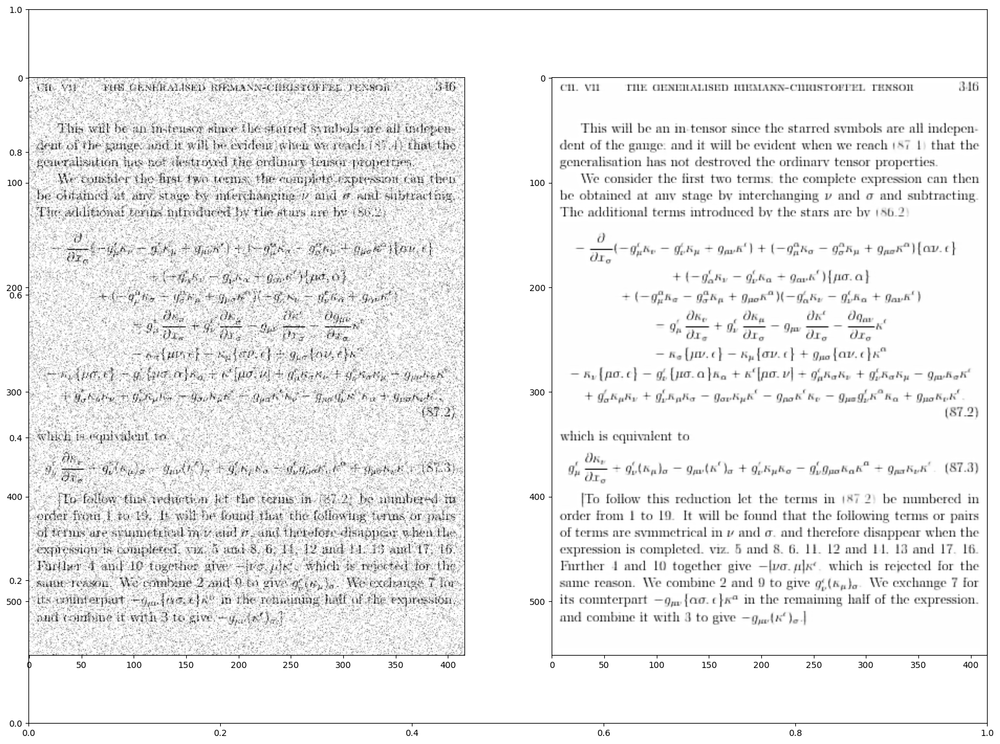

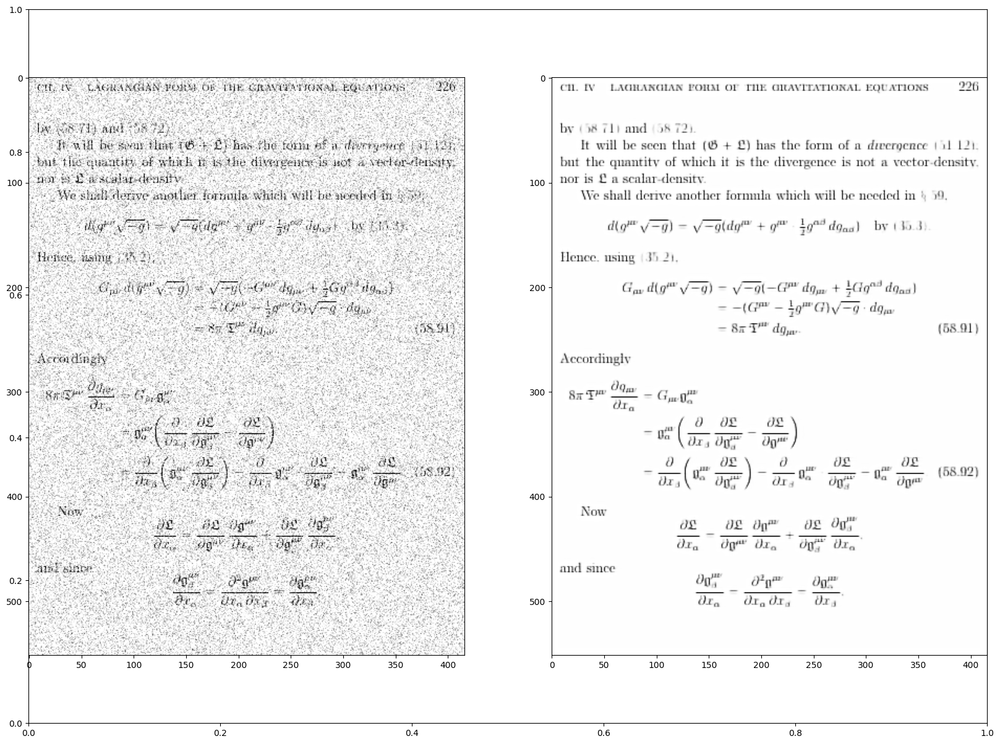

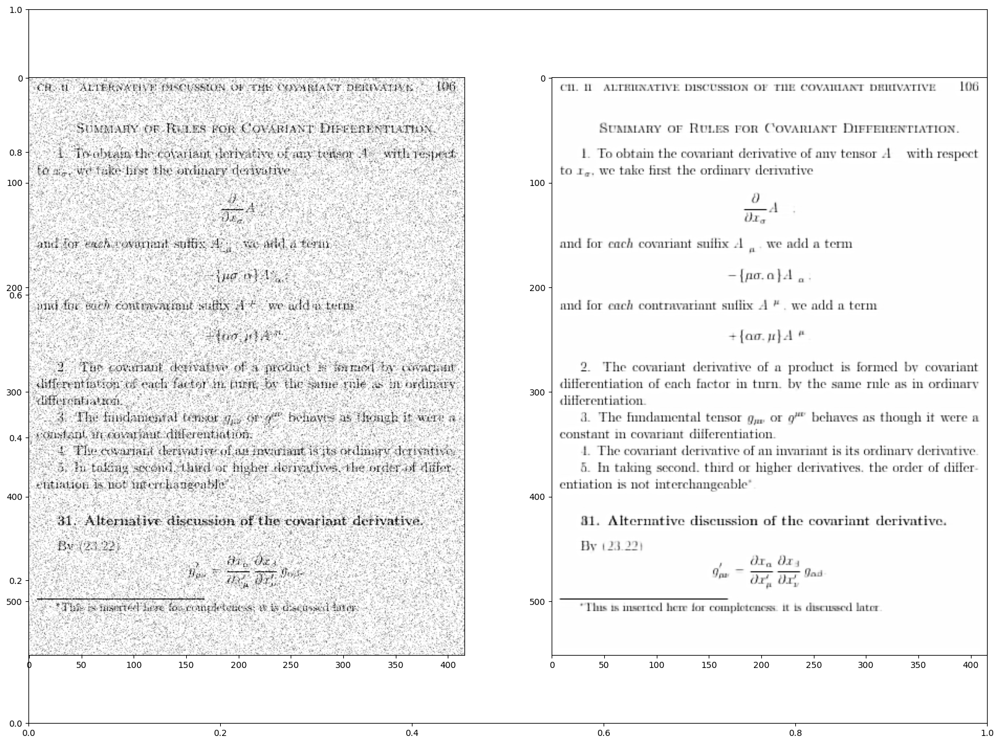

In [8]:
def psnr(ref, target):
    error = ref.astype(np.float32) - target.astype(np.float32)
    mse = np.mean(error**2)
    return 10 * np.log10((255**2)/mse)

predictions = autoencoder.predict(test)

predictions = np.reshape(predictions, test.shape)

print(psnr(predictions, test))
display(noisy_test_data, predictions)


### Results

Noisy vs denoised comparison can be seen above.

Pros:
- Denoised samples are quite readable even for this hard noise. PSNR is 76 which is good result.
Cons:
- Takes a lot of time on CPU (about 110 minutes for 30 epochs.)